In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings

warnings.filterwarnings('ignore')

In [44]:
train = pd.read_csv('data/sales/train.csv')
test = pd.read_csv('data/sales/test.csv')
stores = pd.read_csv('data/sales/stores.csv')
oil = pd.read_csv('data/sales/oil.csv')
holidays_events = pd.read_csv('data/sales/holidays_events.csv')
transactions = pd.read_csv('data/sales/transactions.csv')
sample_submission = pd.read_csv('data/sales/sample_submission.csv')

In [45]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [46]:
len(train.store_nbr.unique()) # 54 lojas

54

In [47]:
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [48]:
# transform type do datetime
train["date"] = pd.to_datetime(train.date)
transactions["date"] = pd.to_datetime(transactions.date)

In [49]:
validation = train.loc[train['date'].dt.year == 2017]

## Sales

### Insights

* The store 44 was the store that sales the most. The store 52 made the least sales.
* The amount of money made in sales increase year by year.
* End of April and begin of May 2016 have a boost in sale in specifics stores - correlated to the earthquake.
* GROCERY II and BEVERAGES are the most sold products.

In [50]:
sales_per_store = train.groupby('store_nbr').agg({"sales" : "sum"}).reset_index()
px.bar(sales_per_store, x='store_nbr', y='sales', title='Sales per store', color='store_nbr')

In [51]:
mean_sales = train.groupby('store_nbr').agg({"sales" : "mean"}).reset_index()
px.bar(mean_sales, x='store_nbr', y='sales', title='Mean sales', color='store_nbr')

In [52]:
sales_per_date = train.groupby(['store_nbr', 'date']).agg({"sales" : "sum"}).reset_index()
px.line(sales_per_date, x='date', y='sales', title='Sales per date', color='store_nbr')

In [53]:
train['month'] = train['date'].dt.to_period('M')
train['day'] = train['date'].dt.dayofweek

<Axes: title={'center': 'Average sales per month'}>

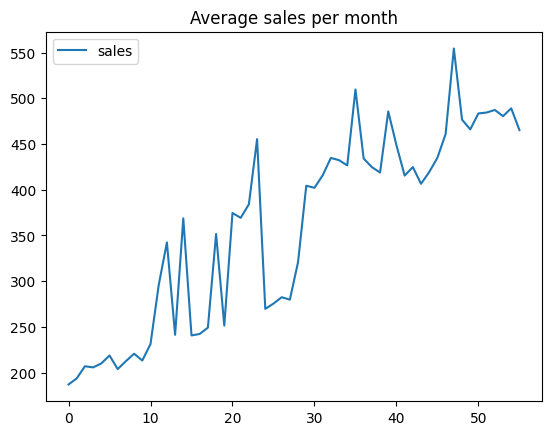

In [54]:
month_sales = train.groupby('month').agg({"sales" : "mean"}).reset_index() # plotly deu erro
month_sales.plot(title='Average sales per month')

In [55]:
day_sales = train.groupby('day').agg({"sales" : "mean"}).reset_index() 
px.line(day_sales, x='day', y='sales', title='Mean sales per week') # 0 = Segunda, 6 = Domingo

In [56]:
product_per_date = train.groupby(['family', 'date']).agg({"sales" : "mean"}).reset_index()
px.line(product_per_date, x='date', y='sales', title='Mean of product type per date', color='family')

In [57]:
product_sales = train.groupby('family').agg({"sales" : "mean"}).reset_index().sort_values(by='sales', ascending=False)
px.bar(product_sales, x='family', y='sales', title='Mean sales', color='family')

## Transactions

### Insights
* The store that have most transactions is the 44. 
* A pattern show us that december is the month that has the most transactions in a year. 
* The number of transactions don't scale up from year to year.

In [58]:
px.line(transactions.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr', title ="Transactions")

## Merge Train and Transaction Dataframes

In [59]:
merged_train = pd.merge(train, transactions, on=['date','store_nbr'], how='left')
merged_train.transactions = merged_train.transactions.fillna(0)
merged_train.head()

,id,date,store_nbr,family,sales,onpromotion,month,day,transactions
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013-01,1,0.0
1,1,2013-01-01,1,BABY CARE,0.0,0,2013-01,1,0.0
2,2,2013-01-01,1,BEAUTY,0.0,0,2013-01,1,0.0
3,3,2013-01-01,1,BEVERAGES,0.0,0,2013-01,1,0.0
4,4,2013-01-01,1,BOOKS,0.0,0,2013-01,1,0.0


<Axes: >

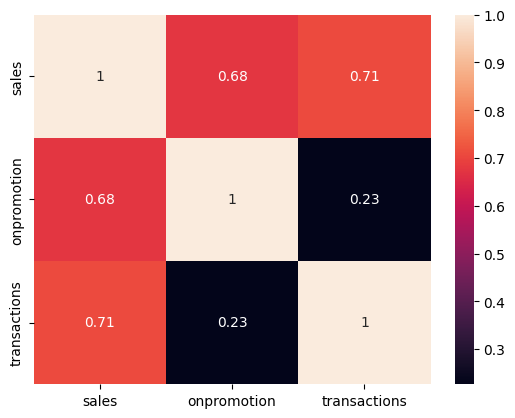

In [63]:
sns.heatmap(merged_train.groupby('date')[['sales', 'onpromotion', 'transactions']].sum().corr('spearman'), annot=True)

## First Model with sales and transactions

In [61]:
# column to ordinal date
merged_train.loc[:, 'ordinal_date'] = merged_train['date'].apply(lambda x: x.toordinal() - 734868)
# column month now has only the month
merged_train['month'] = merged_train['date'].dt.month
# column day now its binary -> if is weekend = 1 else 0
merged_train['weekend'] = merged_train['day'].apply(lambda x: 1 if x >= 5 else 0)

# remove validation data that year < 2017
merged_train = merged_train.loc[merged_train['date'].dt.year < 2017]